2.1理论计算题

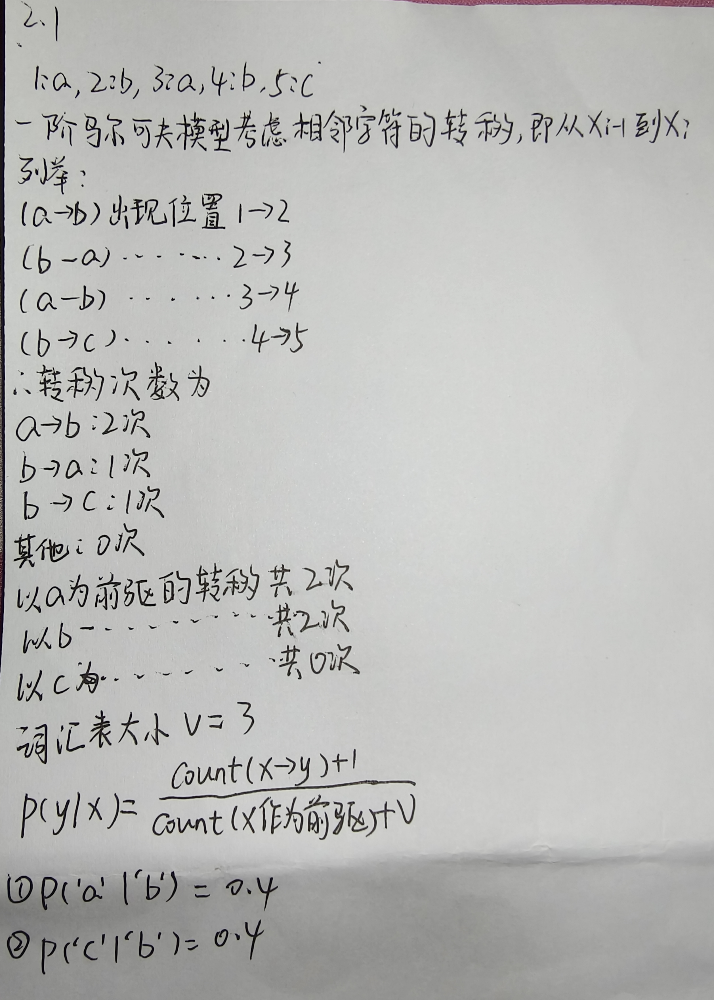

2.2编程题

In [8]:
import re
from collections import Counter

def preprocess_text(text, n):
    
    # ============ 步骤1: 将文本转换为小写，去除标点符号（保留字母和空格） ============
    # 使用正则表达式只保留字母和空格
    text_clean = re.sub(r'[^a-zA-Z\s]', '', text)
    text_clean = text_clean.lower()
    
    # ============ 步骤2: 按空格分词 ============
    # 注意处理多个空格的情况
    tokens = text_clean.split()
    
    # 如果文本为空或没有词，返回空结果
    if not tokens:
        return {}, [], []
    
    # ============ 步骤3: 构建词汇表（按出现频率排序，分配整数ID，从0开始） ============
    # 统计词频
    word_counts = Counter(tokens)
    # 按频率降序排序，频率相同的按字母顺序（可选，保证确定性）
    sorted_words = sorted(word_counts.items(), key=lambda x: (-x[1], x[0]))
    # 分配ID
    vocab = {word: idx for idx, (word, _) in enumerate(sorted_words)}
    
    # ============ 步骤4: 用滑动窗口生成长度为n的特征序列和对应的下一个词标签 ============
    features = []
    labels = []
    
    # 当词数少于n时，无法生成完整的特征序列
    if len(tokens) < n:
        return vocab, [], []
    
    # 滑动窗口
    for i in range(len(tokens) - n):
        # 特征：当前窗口的n个词
        feature_window = tokens[i:i+n]
        # 标签：窗口后的下一个词
        label = tokens[i+n]
        
        features.append(feature_window)
        labels.append(label)
    
    return vocab, features, labels


# ============ 测试部分 ============
if __name__ == "__main__":
    # 测试题目给出的例子
    text = "The time machine"
    n = 2
    vocab, features, labels = preprocess_text(text, n)
    
    print("词汇表:", vocab)
    print("特征序列:", features)
    print("标签:", labels)
    
    
    # 测试带标点和大小写的文本
    text2 = "Hello, world! This is a test. Test, test."
    n = 3
    vocab2, features2, labels2 = preprocess_text(text2, n)
    print("词汇表:", vocab2)
    print("特征序列:", features2)
    print("标签:", labels2)
    
    # 测试短文本
    text3 = "One two"
    n = 2
    vocab3, features3, labels3 = preprocess_text(text3, n)
    print("\n短文本测试:")
    print("词汇表:", vocab3)
    print("特征序列:", features3)
    print("标签:", labels3)

词汇表: {'machine': 0, 'the': 1, 'time': 2}
特征序列: [['the', 'time']]
标签: ['machine']
词汇表: {'test': 0, 'a': 1, 'hello': 2, 'is': 3, 'this': 4, 'world': 5}
特征序列: [['hello', 'world', 'this'], ['world', 'this', 'is'], ['this', 'is', 'a'], ['is', 'a', 'test'], ['a', 'test', 'test']]
标签: ['is', 'a', 'test', 'test', 'test']

短文本测试:
词汇表: {'one': 0, 'two': 1}
特征序列: []
标签: []


3.1理论计算题

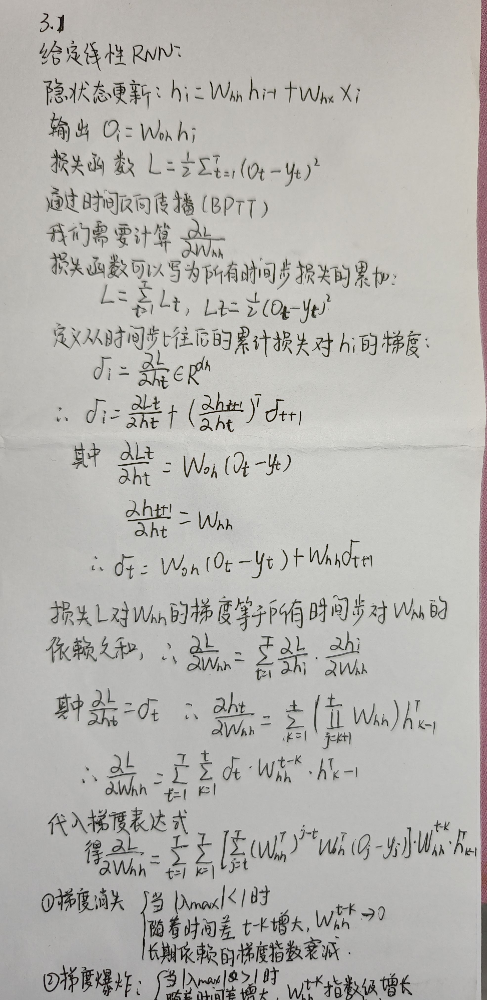

3.2编程题

In [9]:
import numpy as np

def rnn_forward(x_t, h_prev, W_hx, W_hh, b_h):
    # 线性变换
    a = np.dot(x_t, W_hx) + np.dot(h_prev, W_hh) + b_h
    # 激活函数
    h_t = np.tanh(a)
    
    # 缓存中间值用于反向传播
    cache = (x_t, h_prev, W_hx, W_hh, b_h, a, h_t)
    
    return h_t, cache


def rnn_backward(dh_next, cache):
    # 解包缓存
    x_t, h_prev, W_hx, W_hh, b_h, a, h_t = cache
    
    batch_size = x_t.shape[0]
    hidden_size = h_t.shape[1]
    input_size = x_t.shape[1]
    
    da = dh_next * (1 - h_t ** 2)  

    dW_hx = np.dot(x_t.T, da)  
    
    dW_hh = np.dot(h_prev.T, da) 
    
    db_h = np.sum(da, axis=0)  
    
    dx_t = np.dot(da, W_hx.T)  
    
    dh_prev = np.dot(da, W_hh.T)  
    
    return dx_t, dh_prev, dW_hx, dW_hh, db_h


# ============ 测试代码 ============
if __name__ == "__main__":
    # 设置随机种子以便结果可重复
    np.random.seed(42)
    
    # 定义维度
    batch_size = 3
    input_size = 4
    hidden_size = 5
    
    # 初始化输入和参数
    x_t = np.random.randn(batch_size, input_size)
    h_prev = np.random.randn(batch_size, hidden_size)
    W_hx = np.random.randn(input_size, hidden_size)
    W_hh = np.random.randn(hidden_size, hidden_size)
    b_h = np.random.randn(hidden_size)
    
    print("=" * 50)
    print("RNN单元前向传播测试")
    print("=" * 50)
    print(f"x_t 形状: {x_t.shape}")
    print(f"h_prev 形状: {h_prev.shape}")
    print(f"W_hx 形状: {W_hx.shape}")
    print(f"W_hh 形状: {W_hh.shape}")
    print(f"b_h 形状: {b_h.shape}")
    
    # 前向传播
    h_t, cache = rnn_forward(x_t, h_prev, W_hx, W_hh, b_h)
    print(f"\nh_t 形状: {h_t.shape}")
    print(f"h_t 值:\n{h_t[:2, :3]}")  # 只显示部分结果
    
    # 模拟上游梯度
    dh_next = np.random.randn(batch_size, hidden_size)
    print(f"\ndh_next 形状: {dh_next.shape}")
    
    # 反向传播
    dx_t, dh_prev, dW_hx, dW_hh, db_h = rnn_backward(dh_next, cache)
    
    print("\n" + "=" * 50)
    print("RNN单元反向传播测试")
    print("=" * 50)
    print(f"dx_t 形状: {dx_t.shape}")
    print(f"dh_prev 形状: {dh_prev.shape}")
    print(f"dW_hx 形状: {dW_hx.shape}")
    print(f"dW_hh 形状: {dW_hh.shape}")
    print(f"db_h 形状: {db_h.shape}")
    
    # 梯度检查（使用数值梯度验证）
    print("\n" + "=" * 50)
    print("梯度检查（使用数值梯度验证）")
    print("=" * 50)
    
    # 定义一个简单的损失函数用于数值梯度检查
    def compute_loss(x_t, h_prev, W_hx, W_hh, b_h):
        h_t, _ = rnn_forward(x_t, h_prev, W_hx, W_hh, b_h)
        # 假设损失是 h_t 的某种函数，这里用上游梯度 dh_next 来模拟
        # 实际上我们直接比较数值梯度和解析梯度
        return np.sum(h_t * dh_next)  # 用dh_next作为权重
    
    epsilon = 1e-5
    
    # 检查 dW_hh
    W_hh_plus = W_hh.copy()
    W_hh_plus[0, 0] += epsilon
    loss_plus = compute_loss(x_t, h_prev, W_hx, W_hh_plus, b_h)
    
    W_hh_minus = W_hh.copy()
    W_hh_minus[0, 0] -= epsilon
    loss_minus = compute_loss(x_t, h_prev, W_hx, W_hh_minus, b_h)
    
    numerical_grad = (loss_plus - loss_minus) / (2 * epsilon)
    analytical_grad = dW_hh[0, 0]
    
    print(f"dW_hh[0,0] 数值梯度: {numerical_grad:.6f}")
    print(f"dW_hh[0,0] 解析梯度: {analytical_grad:.6f}")
    print(f"相对误差: {abs(numerical_grad - analytical_grad) / max(abs(numerical_grad), abs(analytical_grad), 1e-8):.6e}")
    
    # 检查 dx_t
    x_t_plus = x_t.copy()
    x_t_plus[0, 0] += epsilon
    loss_plus = compute_loss(x_t_plus, h_prev, W_hx, W_hh, b_h)
    
    x_t_minus = x_t.copy()
    x_t_minus[0, 0] -= epsilon
    loss_minus = compute_loss(x_t_minus, h_prev, W_hx, W_hh, b_h)
    
    numerical_grad = (loss_plus - loss_minus) / (2 * epsilon)
    analytical_grad = dx_t[0, 0]
    
    print(f"\ndx_t[0,0] 数值梯度: {numerical_grad:.6f}")
    print(f"dx_t[0,0] 解析梯度: {analytical_grad:.6f}")
    print(f"相对误差: {abs(numerical_grad - analytical_grad) / max(abs(numerical_grad), abs(analytical_grad), 1e-8):.6e}")

RNN单元前向传播测试
x_t 形状: (3, 4)
h_prev 形状: (3, 5)
W_hx 形状: (4, 5)
W_hh 形状: (5, 5)
b_h 形状: (5,)

h_t 形状: (3, 5)
h_t 值:
[[ 0.37757047 -0.85065863 -0.99999996]
 [-0.99893487 -0.99615252 -0.99992555]]

dh_next 形状: (3, 5)

RNN单元反向传播测试
dx_t 形状: (3, 4)
dh_prev 形状: (3, 5)
dW_hx 形状: (4, 5)
dW_hh 形状: (5, 5)
db_h 形状: (5,)

梯度检查（使用数值梯度验证）
dW_hh[0,0] 数值梯度: -0.046423
dW_hh[0,0] 解析梯度: -0.046423
相对误差: 8.413603e-10

dx_t[0,0] 数值梯度: 0.317386
dx_t[0,0] 解析梯度: 0.317386
相对误差: 2.890066e-11


4.1理论计算题

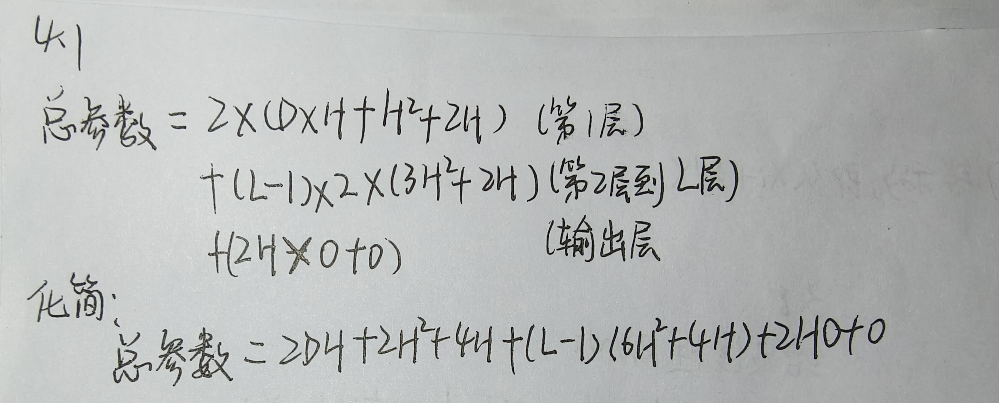

4.2编程题

In [10]:
import torch
import torch.nn as nn
import numpy as np

class BidirectionalRNNEncoder(nn.Module):
    
    def __init__(self, input_dim, hidden_dim, num_layers=1, use_builtin=True):

        super(BidirectionalRNNEncoder, self).__init__()
        
        self.input_dim = input_dim
        self.hidden_dim = hidden_dim
        self.num_layers = num_layers
        self.use_builtin = use_builtin
        
        if use_builtin:
            # 使用PyTorch内置双向RNN
            self.rnn = nn.RNN(
                input_size=input_dim,
                hidden_size=hidden_dim,
                num_layers=num_layers,
                bidirectional=True,
                batch_first=False  # 保持 (seq_len, batch, feature)
            )
        else:
            # 手动实现（仅单层）
            assert num_layers == 1, "手动实现仅支持单层RNN"
            
            # 前向RNN参数
            self.W_hx_f = nn.Parameter(torch.randn(input_dim, hidden_dim) * 0.01)
            self.W_hh_f = nn.Parameter(torch.randn(hidden_dim, hidden_dim) * 0.01)
            self.b_h_f = nn.Parameter(torch.zeros(hidden_dim))
            
            # 后向RNN参数（独立的参数）
            self.W_hx_b = nn.Parameter(torch.randn(input_dim, hidden_dim) * 0.01)
            self.W_hh_b = nn.Parameter(torch.randn(hidden_dim, hidden_dim) * 0.01)
            self.b_h_b = nn.Parameter(torch.zeros(hidden_dim))
    
    def forward(self, X):
        if self.use_builtin:
            return self._forward_builtin(X)
        else:
            return self._forward_manual(X)
    
    def _forward_builtin(self, X):
        """使用PyTorch内置RNN"""
        # X形状: (seq_len, batch, input_dim)
        outputs, h_n = self.rnn(X)
        
        forward_last = outputs[-1, :, :self.hidden_dim]  # (batch, hidden_dim)
        backward_last = outputs[0, :, self.hidden_dim:]  # (batch, hidden_dim)
        
        # 拼接得到最终状态
        final_state = torch.cat([forward_last, backward_last], dim=-1)  # (batch, 2*hidden_dim)
        
        return outputs, final_state
    
    def _forward_manual(self, X):
        """手动实现双向RNN（单层）"""
        seq_len, batch_size, _ = X.shape
        
        # 初始化隐藏状态
        h_f = torch.zeros(batch_size, self.hidden_dim, device=X.device)
        h_b = torch.zeros(batch_size, self.hidden_dim, device=X.device)
        
        # 存储所有时间步的输出
        forward_outputs = []
        backward_outputs = []
        
        # ===== 前向传播 =====
        for t in range(seq_len):
            x_t = X[t]  # (batch, input_dim)
            
            # 线性变换 + tanh激活
            a_f = torch.mm(x_t, self.W_hx_f) + torch.mm(h_f, self.W_hh_f) + self.b_h_f
            h_f = torch.tanh(a_f)
            
            forward_outputs.append(h_f)
        
        # ===== 后向传播 =====
        for t in range(seq_len - 1, -1, -1):
            x_t = X[t]  # (batch, input_dim)
            
            # 线性变换 + tanh激活
            a_b = torch.mm(x_t, self.W_hx_b) + torch.mm(h_b, self.W_hh_b) + self.b_h_b
            h_b = torch.tanh(a_b)
            
            backward_outputs.insert(0, h_b)  # 插入到开头，保持时间顺序
        
        # ===== 拼接前向和后向输出 =====
        outputs = []
        for t in range(seq_len):
            # 拼接前向和后向的隐藏状态
            combined = torch.cat([forward_outputs[t], backward_outputs[t]], dim=-1)
            outputs.append(combined)
        
        outputs = torch.stack(outputs, dim=0)  # (seq_len, batch, 2*hidden_dim)
        
        # 最终状态：最后一个时间步的前向 + 第一个时间步的后向
        final_state = torch.cat([forward_outputs[-1], backward_outputs[0]], dim=-1)
        
        return outputs, final_state


# ============ 测试代码 ============
def test_bidirectional_rnn():
    
    # 设置参数
    seq_len = 5
    batch_size = 3
    input_dim = 4
    hidden_dim = 6
    num_layers = 1
    
    print("=" * 60)
    print("双向RNN编码器测试")
    print("=" * 60)
    print(f"序列长度: {seq_len}")
    print(f"批次大小: {batch_size}")
    print(f"输入维度: {input_dim}")
    print(f"隐藏维度: {hidden_dim}")
    print(f"层数: {num_layers}")
    
    # 创建随机输入
    X = torch.randn(seq_len, batch_size, input_dim)
    print(f"\n输入形状: {X.shape}")
    
    # ===== 测试1: 使用PyTorch内置RNN =====
    print("\n" + "-" * 60)
    print("测试1: 使用PyTorch内置RNN")
    print("-" * 60)
    
    encoder_builtin = BidirectionalRNNEncoder(
        input_dim=input_dim,
        hidden_dim=hidden_dim,
        num_layers=num_layers,
        use_builtin=True
    )
    
    outputs_builtin, final_state_builtin = encoder_builtin(X)
    print(f"输出形状: {outputs_builtin.shape}")
    print(f"最终状态形状: {final_state_builtin.shape}")
    
    # ===== 测试2: 手动实现RNN =====
    print("\n" + "-" * 60)
    print("测试2: 手动实现RNN")
    print("-" * 60)
    
    encoder_manual = BidirectionalRNNEncoder(
        input_dim=input_dim,
        hidden_dim=hidden_dim,
        num_layers=num_layers,
        use_builtin=False
    )
    
    outputs_manual, final_state_manual = encoder_manual(X)
    print(f"输出形状: {outputs_manual.shape}")
    print(f"最终状态形状: {final_state_manual.shape}")
    
    # ===== 测试3: 多层双向RNN（使用内置） =====
    print("\n" + "-" * 60)
    print("测试3: 多层双向RNN (num_layers=2)")
    print("-" * 60)
    
    encoder_multi = BidirectionalRNNEncoder(
        input_dim=input_dim,
        hidden_dim=hidden_dim,
        num_layers=2,
        use_builtin=True
    )
    
    outputs_multi, final_state_multi = encoder_multi(X)
    print(f"输出形状: {outputs_multi.shape}")
    print(f"最终状态形状: {final_state_multi.shape}")
    print(f"注意: 输出的隐藏维度是 2*hidden_dim = {2*hidden_dim}")
    
    # ===== 测试4: 验证手动实现的梯度 =====
    print("\n" + "-" * 60)
    print("测试4: 验证手动实现的梯度传播")
    print("-" * 60)
    
    # 创建一个简单的损失函数
    loss_fn = nn.MSELoss()
    target = torch.randn(batch_size, 2*hidden_dim)
    
    # 前向传播
    outputs, final_state = encoder_manual(X)
    
    # 计算损失（使用最终状态）
    loss = loss_fn(final_state, target)
    
    # 反向传播
    loss.backward()
    
    # 检查梯度是否存在
    has_grad = True
    for name, param in encoder_manual.named_parameters():
        if param.grad is None:
            has_grad = False
            print(f"警告: {name} 没有梯度")
        else:
            grad_norm = param.grad.norm().item()
            print(f"{name} 梯度范数: {grad_norm:.6f}")
    
    if has_grad:
        print("\n✓ 所有参数都有梯度，反向传播成功！")
    else:
        print("\n✗ 部分参数缺少梯度")

    # ===== 测试5: 显示具体输出示例 =====
    print("\n" + "-" * 60)
    print("测试5: 输出示例（手动实现）")
    print("-" * 60)
    
    # 使用较小的维度便于展示
    small_encoder = BidirectionalRNNEncoder(
        input_dim=2,
        hidden_dim=3,
        num_layers=1,
        use_builtin=False
    )
    
    small_X = torch.randn(3, 2, 2)  # (seq_len=3, batch=2, input_dim=2)
    small_outputs, small_final = small_encoder(small_X)
    
    print(f"输入形状: {small_X.shape}")
    print(f"输出形状: {small_outputs.shape}")
    print(f"\n每个时间步的输出（batch=1）:")
    for t in range(small_X.shape[0]):
        print(f"  时间步 {t}: 前向+后向拼接 = {small_outputs[t, 0, :].detach().numpy()}")
    
    print(f"\n最终状态（序列表示）: {small_final[0, :].detach().numpy()}")


if __name__ == "__main__":
    test_bidirectional_rnn()

双向RNN编码器测试
序列长度: 5
批次大小: 3
输入维度: 4
隐藏维度: 6
层数: 1

输入形状: torch.Size([5, 3, 4])

------------------------------------------------------------
测试1: 使用PyTorch内置RNN
------------------------------------------------------------
输出形状: torch.Size([5, 3, 12])
最终状态形状: torch.Size([3, 12])

------------------------------------------------------------
测试2: 手动实现RNN
------------------------------------------------------------
输出形状: torch.Size([5, 3, 12])
最终状态形状: torch.Size([3, 12])

------------------------------------------------------------
测试3: 多层双向RNN (num_layers=2)
------------------------------------------------------------
输出形状: torch.Size([5, 3, 12])
最终状态形状: torch.Size([3, 12])
注意: 输出的隐藏维度是 2*hidden_dim = 12

------------------------------------------------------------
测试4: 验证手动实现的梯度传播
------------------------------------------------------------
W_hx_f 梯度范数: 0.492664
W_hh_f 梯度范数: 0.011159
b_h_f 梯度范数: 0.227001
W_hx_b 梯度范数: 0.350935
W_hh_b 梯度范数: 0.007445
b_h_b 梯度范数: 0.162149

✓ 所有参数都有梯度，反向传播成功！


5.1理论计算题

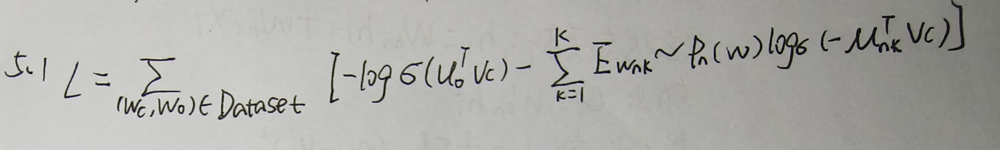

5.2编程题

In [11]:
import numpy as np

def cbow_forward(context_indices, target_index, W, W_out):
    
    # ============ 步骤1: 计算平均上下文向量 ============
    # 提取上下文词的嵌入向量
    context_embeddings = W[context_indices]  # 形状: (context_size, d)
    
    # 计算平均（CBOW的核心：上下文词向量取平均）
    h = np.mean(context_embeddings, axis=0)  # 形状: (d,)
    
    # ============ 步骤2: 计算输出得分 ============
    # 隐藏层到输出层的线性变换
    scores = np.dot(h, W_out)  # 形状: (V,)
    
    # ============ 步骤3: 计算softmax概率分布 ============
    # 数值稳定性：减去最大值防止溢出
    max_score = np.max(scores)
    exp_scores = np.exp(scores - max_score)
    probs = exp_scores / np.sum(exp_scores)  # 形状: (V,)
    
    # ============ 步骤4: 计算交叉熵损失 ============
    # 交叉熵损失: -log(p(target))
    # 注意加上极小值防止log(0)
    loss = -np.log(probs[target_index] + 1e-10)
    
    # ============ 缓存用于反向传播 ============
    cache = (context_indices, target_index, W, W_out, h, probs)
    
    return loss, cache


def cbow_forward_batch(context_batch, target_batch, W, W_out):
   
    losses = []
    caches = []
    total_loss = 0.0
    
    for i in range(len(target_batch)):
        loss, cache = cbow_forward(
            context_batch[i], 
            target_batch[i], 
            W, 
            W_out
        )
        losses.append(loss)
        caches.append(cache)
        total_loss += loss
    
    return total_loss, losses, caches


def cbow_backward(cache):
    
    context_indices, target_index, W, W_out, h, probs = cache
    
    V, d = W.shape
    context_size = len(context_indices)
    
    # ============ 计算输出层梯度 ============
    # softmax交叉熵梯度: d_scores = probs - one_hot(target)
    grad_scores = probs.copy()
    grad_scores[target_index] -= 1.0  # 形状: (V,)
    
    # ============ dW_out: 输出权重梯度 ============
    # 因为 scores = h @ W_out
    # dW_out = h^T @ grad_scores
    dW_out = np.outer(h, grad_scores)  # 形状: (d, V)
    
    # ============ dW: 输入权重梯度 ============
    # 先计算对h的梯度
    # dh = grad_scores @ W_out^T
    dh = np.dot(grad_scores, W_out.T)  # 形状: (d,)
    
    # 然后分配到每个上下文词
    # 因为 h = mean(context_embeddings) = (1/context_size) * sum(context_embeddings)
    # 所以每个上下文词的梯度 = dh / context_size
    grad_per_word = dh / context_size  # 形状: (d,)
    
    # 初始化dW
    dW = np.zeros_like(W)  # 形状: (V, d)
    
    # 将梯度分配给对应的上下文词
    for idx in context_indices:
        dW[idx] += grad_per_word
    
    return dW, dW_out


# ============ 测试代码 ============
def test_cbow():
    """测试CBOW模型实现"""
    
    # 设置参数
    V = 10  # 词汇表大小
    d = 5   # 嵌入维度
    context_size = 3  # 上下文词数量
    
    # 随机初始化权重
    np.random.seed(42)
    W = np.random.randn(V, d) * 0.1  # 输入权重
    W_out = np.random.randn(d, V) * 0.1  # 输出权重
    
    # 模拟一个样本
    context_indices = [2, 5, 7]  # 上下文词索引
    target_index = 3  # 中心词索引
    
    print("=" * 60)
    print("CBOW模型测试（完整Softmax）")
    print("=" * 60)
    print(f"词汇表大小: {V}")
    print(f"嵌入维度: {d}")
    print(f"上下文词数量: {context_size}")
    print(f"上下文索引: {context_indices}")
    print(f"目标索引: {target_index}")
    print(f"W 形状: {W.shape}")
    print(f"W_out 形状: {W_out.shape}")
    
    # 前向传播
    loss, cache = cbow_forward(context_indices, target_index, W, W_out)
    
    print(f"\n损失值: {loss:.6f}")
    
    # 检查输出概率分布
    _, _, _, _, h, probs = cache
    print(f"\n隐藏层向量 (平均上下文): {h}")
    print(f"\n输出概率分布 (前5个): {probs[:5]}")
    print(f"目标词概率: {probs[target_index]:.6f}")
    print(f"概率总和: {np.sum(probs):.6f}")
    
    # ============ 梯度检查 ============
    print("\n" + "=" * 60)
    print("梯度检查（数值梯度 vs 解析梯度）")
    print("=" * 60)
    
    def compute_loss(W, W_out):
        loss, _ = cbow_forward(context_indices, target_index, W, W_out)
        return loss
    
    # 计算解析梯度
    dW, dW_out = cbow_backward(cache)
    
    # 数值梯度计算
    epsilon = 1e-6
    dW_numerical = np.zeros_like(W)
    dW_out_numerical = np.zeros_like(W_out)
    
    # 检查 W 的梯度
    print("\n检查 dW 梯度:")
    for i in range(min(3, V)):  # 只检查前3行
        for j in range(min(2, d)):  # 只检查前2列
            # 正向扰动
            W_plus = W.copy()
            W_plus[i, j] += epsilon
            loss_plus = compute_loss(W_plus, W_out)
            
            # 负向扰动
            W_minus = W.copy()
            W_minus[i, j] -= epsilon
            loss_minus = compute_loss(W_minus, W_out)
            
            # 数值梯度
            grad_num = (loss_plus - loss_minus) / (2 * epsilon)
            grad_ana = dW[i, j]
            
            # 相对误差
            rel_error = abs(grad_num - grad_ana) / max(abs(grad_num), abs(grad_ana), 1e-8)
            print(f"  dW[{i},{j}]: 数值={grad_num:.6f}, 解析={grad_ana:.6f}, 误差={rel_error:.2e}")
    
    # 检查 W_out 的梯度
    print("\n检查 dW_out 梯度:")
    for i in range(min(2, d)):
        for j in range(min(3, V)):
            # 正向扰动
            W_out_plus = W_out.copy()
            W_out_plus[i, j] += epsilon
            loss_plus = compute_loss(W, W_out_plus)
            
            # 负向扰动
            W_out_minus = W_out.copy()
            W_out_minus[i, j] -= epsilon
            loss_minus = compute_loss(W, W_out_minus)
            
            # 数值梯度
            grad_num = (loss_plus - loss_minus) / (2 * epsilon)
            grad_ana = dW_out[i, j]
            
            # 相对误差
            rel_error = abs(grad_num - grad_ana) / max(abs(grad_num), abs(grad_ana), 1e-8)
            print(f"  dW_out[{i},{j}]: 数值={grad_num:.6f}, 解析={grad_ana:.6f}, 误差={rel_error:.2e}")
    
    print("\n" + "=" * 60)
    print("批处理测试")
    print("=" * 60)
    
    # 批处理测试
    batch_size = 4
    context_batch = [
        [1, 3, 5],
        [2, 4, 6],
        [0, 2, 8],
        [3, 5, 7]
    ]
    target_batch = [5, 3, 1, 8]
    
    total_loss, losses, caches = cbow_forward_batch(
        context_batch, target_batch, W, W_out
    )
    
    print(f"批次大小: {batch_size}")
    print(f"每个样本的损失: {[f'{l:.6f}' for l in losses]}")
    print(f"总损失: {total_loss:.6f}")
    print(f"平均损失: {total_loss/batch_size:.6f}")


def visualize_cbow():
    """可视化CBOW的计算过程"""
    print("\n" + "=" * 60)
    print("CBOW前向传播可视化")
    print("=" * 60)
    
    # 设置参数
    V = 8
    d = 4
    
    # 初始化权重
    np.random.seed(123)
    W = np.random.randn(V, d) * 0.1
    W_out = np.random.randn(d, V) * 0.1  # 修正：在这里定义 W_out
    
    # 创建语义上有意义的虚拟数据
    print(f"\n词汇表 (V={V}):")
    words = ['the', 'cat', 'sat', 'on', 'mat', 'dog', 'ran', 'fast']
    for i, word in enumerate(words):
        print(f"  {i}: {word}")
    
    # 模拟一个句子
    context = [1, 2, 3]  # ['cat', 'sat', 'on']
    target = 4           # 'mat'
    
    print(f"\n上下文词: {[words[i] for i in context]}")
    print(f"目标词: {words[target]}")
    
    # 前向传播
    loss, cache = cbow_forward(context, target, W, W_out)
    
    # 提取中间结果
    context_embeddings = W[context]
    _, _, _, _, h, probs = cache
    
    print(f"\n上下文词向量 (形状: {context_embeddings.shape}):")
    for i, idx in enumerate(context):
        print(f"  {words[idx]}: {context_embeddings[i]}")
    
    print(f"\n平均向量 h (形状: {h.shape}):")
    print(f"  {h}")
    
    print(f"\n输出概率分布 (前5个):")
    for i in range(min(5, V)):
        print(f"  {words[i]}: {probs[i]:.6f}")
    
    print(f"\n目标词 '{words[target]}' 的概率: {probs[target]:.6f}")
    print(f"交叉熵损失: {loss:.6f}")
    
    # 解释
    print(f"\n解释:")
    print(f"  上下文词的平均向量作为隐藏层表示")
    print(f"  通过softmax得到所有词的概率分布")
    print(f"  损失 = -log(p(target)) = {loss:.6f}")
    print(f"  如果目标词概率接近1，损失接近0")


if __name__ == "__main__":
    test_cbow()
    visualize_cbow()

CBOW模型测试（完整Softmax）
词汇表大小: 10
嵌入维度: 5
上下文词数量: 3
上下文索引: [2, 5, 7]
目标索引: 3
W 形状: (10, 5)
W_out 形状: (5, 10)

损失值: 2.297429

隐藏层向量 (平均上下文): [-0.05244463 -0.04692866 -0.04473366 -0.12807017 -0.06065834]

输出概率分布 (前5个): [0.1002284  0.09867742 0.09953686 0.10051693 0.10164908]
目标词概率: 0.100517
概率总和: 1.000000

梯度检查（数值梯度 vs 解析梯度）

检查 dW 梯度:
  dW[0,0]: 数值=0.000000, 解析=0.000000, 误差=0.00e+00
  dW[0,1]: 数值=0.000000, 解析=0.000000, 误差=0.00e+00
  dW[1,0]: 数值=0.000000, 解析=0.000000, 误差=0.00e+00
  dW[1,1]: 数值=0.000000, 解析=0.000000, 误差=0.00e+00
  dW[2,0]: 数值=-0.013597, 解析=-0.013597, 误差=1.56e-08
  dW[2,1]: 数值=0.039404, 解析=0.039404, 误差=4.55e-09

检查 dW_out 梯度:
  dW_out[0,0]: 数值=-0.005256, 解析=-0.005256, 误差=1.50e-08
  dW_out[0,1]: 数值=-0.005175, 解析=-0.005175, 误差=7.35e-10
  dW_out[0,2]: 数值=-0.005220, 解析=-0.005220, 误差=8.22e-09
  dW_out[1,0]: 数值=-0.004704, 解析=-0.004704, 误差=4.49e-08
  dW_out[1,1]: 数值=-0.004631, 解析=-0.004631, 误差=1.98e-08
  dW_out[1,2]: 数值=-0.004671, 解析=-0.004671, 误差=8.10e-09

批处理测试
批次大小: 4
每个样本的损失: ['2

6.1理论计算题

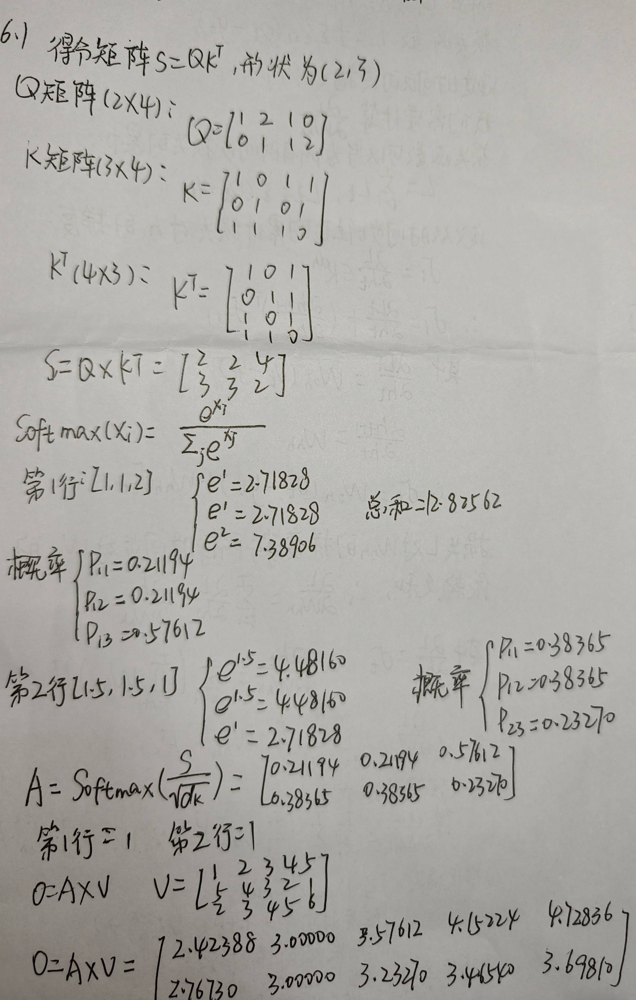

6.2编程题

In [12]:
import numpy as np

class MultiHeadAttention:
   
    def __init__(self, d_model, num_heads):
        
        self.d_model = d_model
        self.num_heads = num_heads
        self.d_k = d_model // num_heads  # 每个头的键维度
        self.d_v = d_model // num_heads  # 每个头的值维度
        
        assert d_model % num_heads == 0, "d_model必须能被num_heads整除"
        
        # 初始化权重矩阵（使用Xavier初始化）
        # 注意：为了简化，这里使用随机初始化，实际应用中应使用更好的初始化
        np.random.seed(42)
        
        # 查询、键、值的投影矩阵
        self.W_q = np.random.randn(d_model, d_model) * 0.1
        self.W_k = np.random.randn(d_model, d_model) * 0.1
        self.W_v = np.random.randn(d_model, d_model) * 0.1
        
        # 最终输出投影矩阵
        self.W_o = np.random.randn(d_model, d_model) * 0.1
        
        # 缓存用于可能的反向传播
        self.cache = {}
    
    def scaled_dot_product_attention(self, Q, K, V, mask=None):
        
        # 计算得分矩阵
        # Q @ K^T / sqrt(d_k)
        d_k = Q.shape[-1]
        scores = np.matmul(Q, K.transpose(0, 1, 3, 2)) / np.sqrt(d_k)
        
        # 应用掩码（如果有）
        if mask is not None:
            # 将掩码位置设为负无穷，使得softmax后概率为0
            scores = np.where(mask == 0, -1e9, scores)
        
        # Softmax得到注意力权重
        attention_weights = self.softmax(scores, axis=-1)
        
        # 加权求和
        output = np.matmul(attention_weights, V)
        
        return output, attention_weights
    
    def softmax(self, x, axis=-1):

        # 减去最大值防止溢出
        x_max = np.max(x, axis=axis, keepdims=True)
        exp_x = np.exp(x - x_max)
        return exp_x / np.sum(exp_x, axis=axis, keepdims=True)
    
    def split_heads(self, x, batch_size, seq_len):
        
        # 重塑: (seq_len, batch_size, num_heads, d_k)
        x = x.reshape(seq_len, batch_size, self.num_heads, self.d_k)
        # 转置: (batch_size, num_heads, seq_len, d_k)
        return x.transpose(1, 2, 0, 3)
    
    def combine_heads(self, x, batch_size, seq_len):
        
        # 转置: (seq_len, batch_size, num_heads, d_k)
        x = x.transpose(2, 0, 1, 3)
        # 重塑: (seq_len, batch_size, d_model)
        return x.reshape(seq_len, batch_size, self.d_model)
    
    def forward(self, X, mask=None):
        
        seq_len, batch_size, _ = X.shape
        
        # ===== 步骤1: 线性投影得到Q, K, V =====
        # 线性变换
        Q = np.dot(X, self.W_q)  # (seq_len, batch_size, d_model)
        K = np.dot(X, self.W_k)  # (seq_len, batch_size, d_model)
        V = np.dot(X, self.W_v)  # (seq_len, batch_size, d_model)
        
        # ===== 步骤2: 分割成多头 =====
        # 形状: (batch_size, num_heads, seq_len, d_k)
        Q_heads = self.split_heads(Q, batch_size, seq_len)
        K_heads = self.split_heads(K, batch_size, seq_len)
        V_heads = self.split_heads(V, batch_size, seq_len)
        
        # ===== 步骤3: 对每个头计算缩放点积注意力 =====
        # 存储每个头的输出
        head_outputs = []
        attention_weights_list = []
        
        for h in range(self.num_heads):
            # 提取第h个头的Q, K, V
            Q_h = Q_heads[:, h, :, :]   # (batch_size, seq_len, d_k)
            K_h = K_heads[:, h, :, :]   # (batch_size, seq_len, d_k)
            V_h = V_heads[:, h, :, :]   # (batch_size, seq_len, d_v)
            
            # 调整维度顺序为 (batch_size, seq_len, d_k) 已经是这样
            # 但是scaled_dot_product_attention期望 (..., seq_len, d_k)
            # 添加维度以匹配 (batch, seq_len, d_k) 已经是这个形状
            
            # 计算注意力
            # 注意：需要将维度调整为 (batch_size, seq_len, d_k)
            # 已经是这个形状了
            
            # 但如果mask是三维的 (batch_size, seq_len, seq_len)，需要保持不变
            head_mask = mask if mask is None else mask[:, :, :seq_len]
            
            output_h, weights_h = self.scaled_dot_product_attention(
                Q_h[:, np.newaxis, :, :],  # (batch_size, 1, seq_len, d_k)
                K_h[:, np.newaxis, :, :],  # (batch_size, 1, seq_len, d_k)
                V_h[:, np.newaxis, :, :],  # (batch_size, 1, seq_len, d_v)
                mask=head_mask[:, np.newaxis, :, :] if mask is not None else None
            )
            
            # 移除多余的维度
            output_h = output_h.squeeze(1)  # (batch_size, seq_len, d_v)
            weights_h = weights_h.squeeze(1)  # (batch_size, seq_len, seq_len)
            
            head_outputs.append(output_h)
            attention_weights_list.append(weights_h)
        
        # ===== 步骤4: 拼接所有头的输出 =====
        # (batch_size, seq_len, num_heads * d_v) = (batch_size, seq_len, d_model)
        concat_output = np.concatenate(head_outputs, axis=-1)
        
        # 调整维度为 (seq_len, batch_size, d_model)
        concat_output = concat_output.transpose(1, 0, 2)
        
        # ===== 步骤5: 最终的线性投影 =====
        output = np.dot(concat_output, self.W_o)
        
        # 缓存用于可能的反向传播
        self.cache = {
            'X': X,
            'Q': Q,
            'K': K,
            'V': V,
            'Q_heads': Q_heads,
            'K_heads': K_heads,
            'V_heads': V_heads,
            'concat_output': concat_output,
            'attention_weights': attention_weights_list
        }
        
        return output
    
    def get_attention_weights(self):
        
        return self.cache.get('attention_weights', None)


# ============ 测试代码 ============
def test_multi_head_attention():
    """测试多头注意力机制"""
    
    print("=" * 70)
    print("多头注意力机制测试")
    print("=" * 70)
    
    # 设置参数
    d_model = 4
    num_heads = 2
    seq_len = 3
    batch_size = 2
    
    print(f"模型维度: {d_model}")
    print(f"注意力头数: {num_heads}")
    print(f"每个头的维度: d_k = d_v = {d_model // num_heads}")
    print(f"序列长度: {seq_len}")
    print(f"批次大小: {batch_size}")
    
    # 创建输入
    np.random.seed(42)
    X = np.random.randn(seq_len, batch_size, d_model)
    
    print(f"\n输入形状: {X.shape}")
    print("输入示例 (第1个时间步, 第1个样本):")
    print(X[0, 0, :])
    
    # 创建多头注意力
    mha = MultiHeadAttention(d_model, num_heads)
    
    # 前向传播
    output = mha.forward(X)
    
    print(f"\n输出形状: {output.shape}")
    print("输出示例 (第1个时间步, 第1个样本):")
    print(output[0, 0, :])
    
    # 获取注意力权重
    attention_weights = mha.get_attention_weights()
    
    print(f"\n注意力权重数量: {len(attention_weights)}")
    for h in range(num_heads):
        print(f"头 {h+1} 注意力权重形状: {attention_weights[h].shape}")
        print(f"头 {h+1} 注意力权重 (第1个样本):")
        print(attention_weights[h][0])
    
    print("\n" + "=" * 70)
    print("详细步骤验证")
    print("=" * 70)
    
    # 验证维度变化
    print("\n维度变化过程:")
    print(f"1. 输入 X: {X.shape}")
    
    Q = np.dot(X, mha.W_q)
    K = np.dot(X, mha.W_k)
    V = np.dot(X, mha.W_v)
    print(f"2. 线性投影后 Q: {Q.shape}, K: {K.shape}, V: {V.shape}")
    
    Q_heads = mha.split_heads(Q, batch_size, seq_len)
    print(f"3. 分割成多头 Q_heads: {Q_heads.shape} (batch, heads, seq_len, d_k)")
    
    print(f"4. 每个头独立计算注意力")
    print(f"5. 拼接所有头: (seq_len, batch, {d_model})")
    print(f"6. 最终线性投影: {output.shape}")
    
    # 验证输出与输入形状相同
    assert output.shape == X.shape, f"输出形状 {output.shape} 应与输入形状 {X.shape} 相同"
    print(f"\n✓ 输出形状与输入形状一致: {output.shape}")
    
    # 验证每个头的维度
    for h in range(num_heads):
        assert attention_weights[h].shape == (batch_size, seq_len, seq_len), \
            f"头 {h} 注意力权重形状错误: {attention_weights[h].shape}"
    print(f"✓ 所有头的注意力权重形状正确: (batch_size, seq_len, seq_len)")
    
    # 验证softmax性质（每行和为1）
    print("\n验证Softmax性质 (注意力权重每行和为1):")
    for h in range(num_heads):
        row_sums = np.sum(attention_weights[h][0], axis=-1)
        print(f"  头 {h+1} 第1个样本每行和: {row_sums}")
        assert np.allclose(row_sums, 1.0, atol=1e-6), f"头 {h+1} 的softmax行和不为1"
    print(f"✓ 所有头的注意力权重都满足softmax性质")


def visualize_attention():
    """可视化注意力机制"""
    print("\n" + "=" * 70)
    print("注意力机制可视化")
    print("=" * 70)
    
    # 创建简单示例
    d_model = 4
    num_heads = 2
    seq_len = 3
    batch_size = 1
    
    mha = MultiHeadAttention(d_model, num_heads)
    
    # 创建有意义的输入
    np.random.seed(123)
    X = np.random.randn(seq_len, batch_size, d_model)
    
    print("\n输入序列 (每个时间步):")
    for t in range(seq_len):
        print(f"  时间步 {t}: {X[t, 0, :]}")
    
    # 前向传播
    output = mha.forward(X)
    
    print("\n输出序列 (每个时间步):")
    for t in range(seq_len):
        print(f"  时间步 {t}: {output[t, 0, :]}")
    
    # 显示注意力权重
    attention_weights = mha.get_attention_weights()
    
    print("\n注意力权重矩阵 (每个头):")
    for h in range(num_heads):
        print(f"\n头 {h+1}:")
        print("  行 = 查询位置, 列 = 键位置")
        print(f"  {attention_weights[h][0]}")
    
    # 解释
    print("\n" + "=" * 70)
    print("解释")
    print("=" * 70)
    print("多头注意力允许模型从不同角度关注输入序列的不同部分")
    print("每个头学习不同的注意力模式")
    print("最终通过拼接和线性投影融合所有头的输出")


if __name__ == "__main__":
    test_multi_head_attention()
    visualize_attention()

多头注意力机制测试
模型维度: 4
注意力头数: 2
每个头的维度: d_k = d_v = 2
序列长度: 3
批次大小: 2

输入形状: (3, 2, 4)
输入示例 (第1个时间步, 第1个样本):
[ 0.49671415 -0.1382643   0.64768854  1.52302986]

输出形状: (3, 2, 4)
输出示例 (第1个时间步, 第1个样本):
[ 0.00295132 -0.00066972 -0.00672659 -0.01064485]

注意力权重数量: 2
头 1 注意力权重形状: (2, 3, 3)
头 1 注意力权重 (第1个样本):
[[0.33123909 0.3342942  0.3344667 ]
 [0.33500799 0.33273104 0.33226096]
 [0.33646633 0.332072   0.33146167]]
头 2 注意力权重形状: (2, 3, 3)
头 2 注意力权重 (第1个样本):
[[0.34873558 0.33021749 0.32104692]
 [0.32423525 0.33513348 0.34063126]
 [0.31530973 0.33717065 0.34751962]]

详细步骤验证

维度变化过程:
1. 输入 X: (3, 2, 4)
2. 线性投影后 Q: (3, 2, 4), K: (3, 2, 4), V: (3, 2, 4)
3. 分割成多头 Q_heads: (2, 2, 3, 2) (batch, heads, seq_len, d_k)
4. 每个头独立计算注意力
5. 拼接所有头: (seq_len, batch, 4)
6. 最终线性投影: (3, 2, 4)

✓ 输出形状与输入形状一致: (3, 2, 4)
✓ 所有头的注意力权重形状正确: (batch_size, seq_len, seq_len)

验证Softmax性质 (注意力权重每行和为1):
  头 1 第1个样本每行和: [1. 1. 1.]
  头 2 第1个样本每行和: [1. 1. 1.]
✓ 所有头的注意力权重都满足softmax性质

注意力机制可视化

输入序列 (每个时间步):
  时间步 0: [-1.0856306   0.997